In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as ply
from sklearn.model_selection import TimeSeriesSplit
from fbprophet import Prophet
%matplotlib inline

In [2]:
df_actual = pd.read_csv("../write_data/Minneapolis-St Paul.csv")
df_actual['time'] = pd.to_datetime(df_actual['time'])

In [3]:
df_fut = pd.read_csv("../write_data/Minneapolis-St Paul_future.csv")
df_fut['ds'] = pd.to_datetime(df_fut['ds'])

In [4]:
zippies = df_fut.Zip_code.unique()

In [5]:
all_zips = pd.read_csv("../write_data/zillow_housing_zipcodes.csv")
all_zips['Date_index'] = pd.to_datetime(all_zips['Date_index'])
all_zips = all_zips.set_index('Date_index')

In [6]:
zippies_strings = ["%.0f" % number for number in zippies]

In [7]:
metro_zips = all_zips.filter(items=zippies_strings)

In [8]:
actual_mean = metro_zips.mean(axis=1)

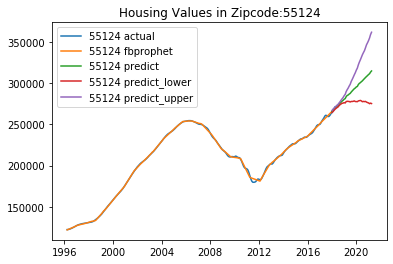

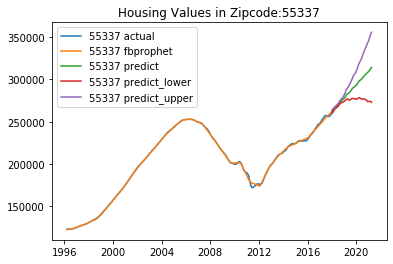

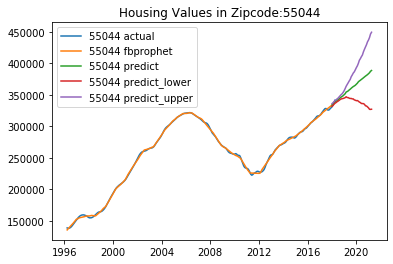

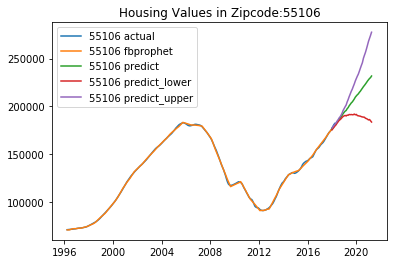

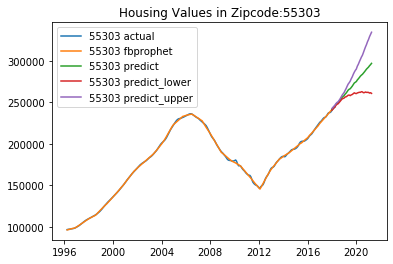

...

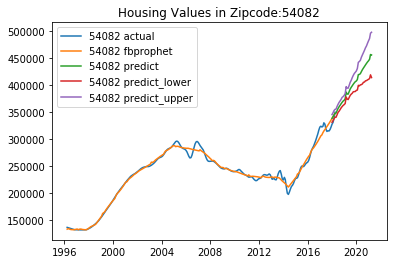

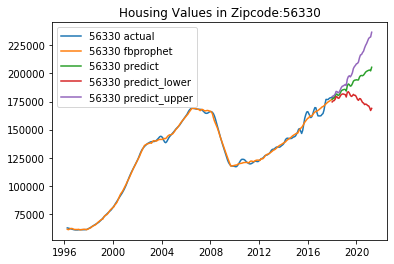

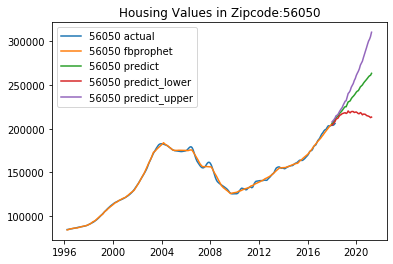

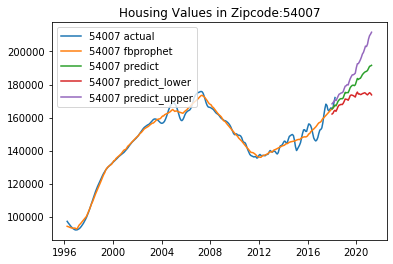

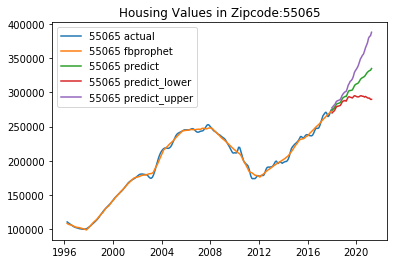

In [9]:
for zippy in zippies:
    
    plt.plot(df_actual[df_actual['Zip_code'] == zippy]['time'], 
             df_actual[df_actual['Zip_code'] == zippy]['value'], 
             label=f'{zippy} actual')

    plt.plot(df_actual[df_actual['Zip_code'] == zippy]['time'], 
             df_actual[df_actual['Zip_code'] == zippy]['yhat'], 
             label=f'{zippy} fbprophet')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat'], 
             label=f'{zippy} predict')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat_lower'], 
             label=f'{zippy} predict_lower')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat_upper'], 
             label=f'{zippy} predict_upper')
    
    plt.legend(loc='best')
    plt.title(f"Housing Values in Zipcode:{zippy}")
    
    plt.show()

In [10]:
zippies

array([55124, 55337, 55044, 55106, 55303, 55104, 55113, 55112, 55408,
       55416, 55125, 55117, 55406, 55304, 55379, 55110, 55119, 55423,
       55407, 55330, 55369, 55082, 55414, 55433, 55418, 55122, 55109,
       55311, 54016, 55404, 55432, 55118, 55343, 55422, 55372, 55016,
       55116, 55443, 55421, 55426, 55428, 55024, 55128, 55033, 55403,
       55105, 55434, 55347, 55126, 55417, 55419, 55448, 55318, 55429,
       55449, 55068, 55427, 55378, 55305, 55102, 55014, 55411, 55025,
       55420, 55123, 55446, 55076, 55129, 55313, 55345, 55447, 55316,
       55410, 55412, 55437, 55075, 55431, 55038, 55317, 55430, 55441,
       55344, 55438, 55405, 55362, 55127, 55435, 55331, 54017, 55309,
       55391, 55401, 55306, 55371, 55108, 55346, 55364, 55008, 55413,
       55436, 55398, 55376, 55130, 55107, 55442, 55444, 55387, 55056,
       55374, 55103, 55077, 55040, 55409, 56071, 55425, 55445, 55121,
       55301, 55092, 55439, 55011, 56353, 55042, 55424, 56011, 55352,
       55328, 55115,

In [11]:
metro_annual = metro_zips.resample("YS").mean()
metro_annual_pct = metro_annual.pct_change()
metro_annual_pct_diff = metro_annual.pct_change().diff()

In [12]:
metro_annual_pct.min().min(), metro_annual_pct.max().max()

(-0.3087141919965013, 0.35733772342427095)

In [13]:
metro_annual_pct.tail(3).T.sort_values('2018-01-01', ascending=False)

Date_index,2016-01-01,2017-01-01,2018-01-01
55384,0.107927,0.060032,0.143554
55411,0.150547,0.152016,0.130552
55102,0.083921,0.132456,0.108443
55103,0.077819,0.140893,0.098497
55397,0.103413,0.039651,0.094855
...,...,...,...
55349,0.075359,0.054092,-0.002248
55358,0.097320,0.071635,-0.002455
55320,0.098835,0.046726,-0.002473
55302,0.099175,0.058874,-0.035605


In [14]:
metro_annual_pct_diff.min().min(), metro_annual_pct_diff.max().max()

(-0.2967310179786624, 0.3095330219211331)

In [15]:
df_pred_wide = df_actual.pivot(index='time', columns='Zip_code',values='yhat')
df_fut_wide = df_fut.pivot(index='ds', columns='Zip_code',values='yhat')

In [16]:
fbproph = pd.concat([df_pred_wide.resample("YS").mean(), df_fut_wide.resample("YS").mean()], axis=0)
fb_pct_change = fbproph.pct_change()
fb_ann = fbproph.pct_change().diff()

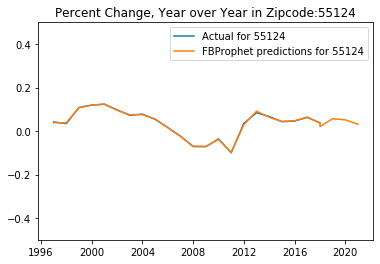

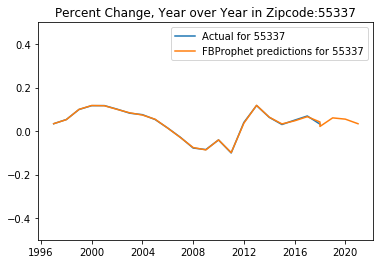

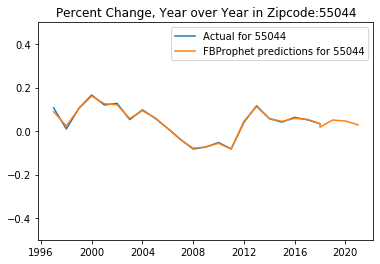

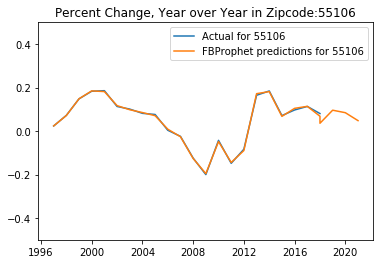

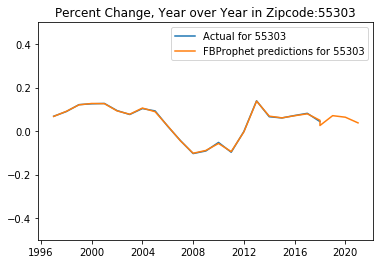

...

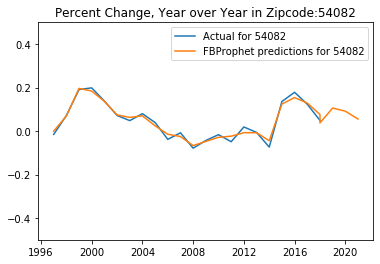

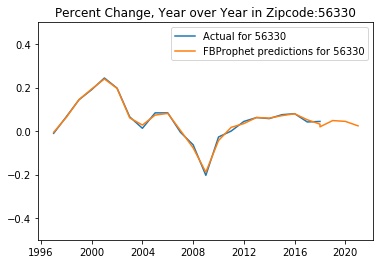

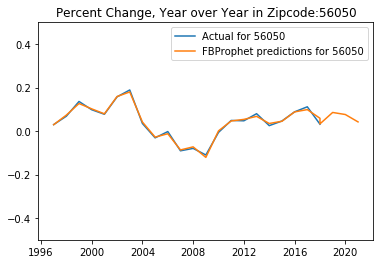

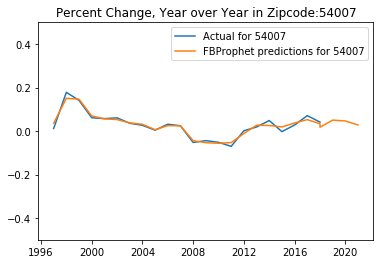

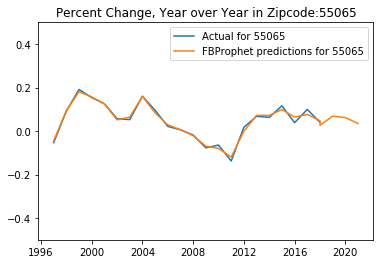

In [17]:
for zippy in zippies:
    
    plt.plot(metro_annual_pct.index, 
         metro_annual_pct[str(zippy)], 
         label=f'Actual for {zippy}')
    
    plt.plot(fb_pct_change.index, 
             fb_pct_change[zippy], 
             label=f'FBProphet predictions for {zippy}')

    plt.ylim(-0.5,0.5)
    plt.legend(loc='best')
    plt.title(f"Percent Change, Year over Year in Zipcode:{zippy}")
    
    plt.show()

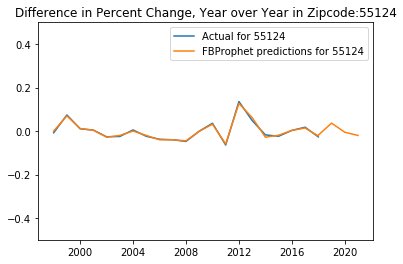

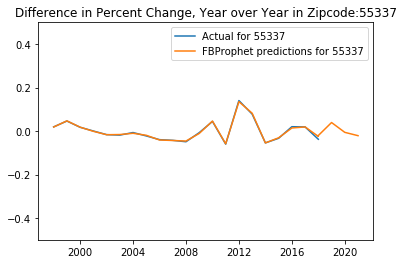

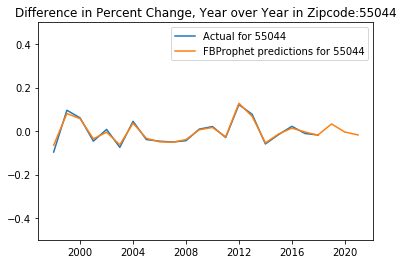

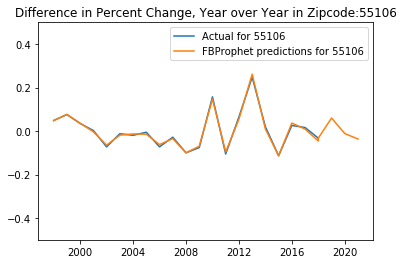

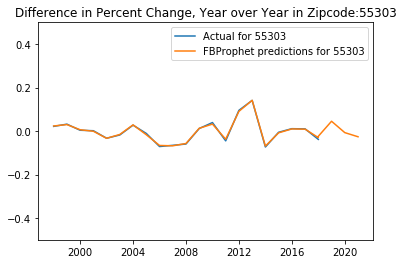

...

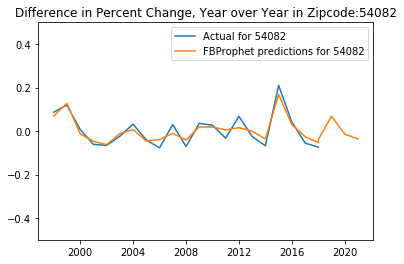

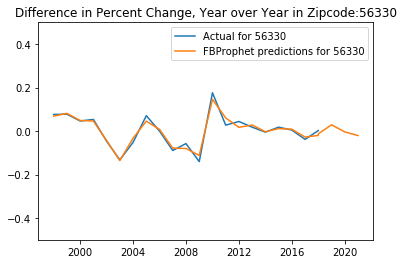

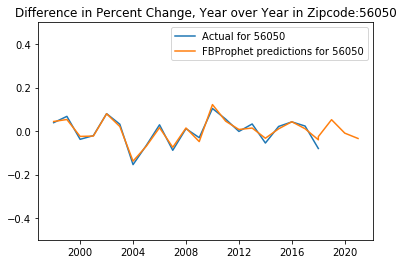

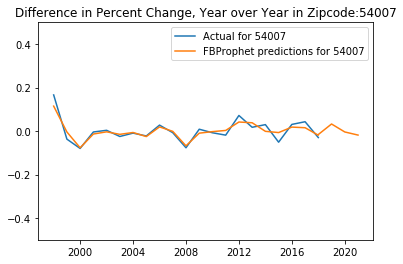

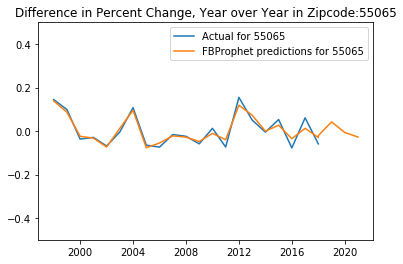

In [18]:
for zippy in zippies:
    
    plt.plot(metro_annual_pct_diff.index, 
         metro_annual_pct_diff[str(zippy)], 
         label=f'Actual for {zippy}')
    
    plt.plot(fb_ann.index, 
             fb_ann[zippy], 
             label=f'FBProphet predictions for {zippy}')

    plt.ylim(-0.5,0.5)
    plt.legend(loc='best')
    plt.title(f"Difference in Percent Change, Year over Year in Zipcode:{zippy}")
    
    plt.show()

In [19]:
metro_annual_pct_diff.tail(3).T.sort_values('2018-01-01', ascending=False)

Date_index,2016-01-01,2017-01-01,2018-01-01
55384,0.055837,-0.047895,0.083523
55397,0.022468,-0.063762,0.055204
55001,0.100460,-0.087233,0.054337
55042,0.013826,-0.009289,0.029714
55073,0.050751,-0.052300,0.025033
...,...,...,...
54013,0.017499,-0.035987,-0.075164
56050,0.042279,0.023103,-0.080062
55313,0.052036,0.000215,-0.089465
55302,-0.021451,-0.040301,-0.094478
